## 설거지 애매하긴 해 ~
설거지를 할 지 말 지 판단해주는 AI CNN을 활용하여..

In [87]:
pip install "kagglehub[pandas-datasets]"

15423.25s - pydevd: Sending message related to process being replaced timed-out after 5 seconds


Note: you may need to restart the kernel to use updated packages.


In [88]:
import os, shutil
from pathlib import Path
import numpy as np
import pandas as pd
import seaborn as sns

import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

import tensorflow as tf
from tensorflow.keras.preprocessing import image

In [89]:
# (처음 1회) 필요한 패키지 설치
# - Jetson에서는 TensorFlow 설치가 환경마다 다릅니다.
#   이 노트북은 TensorFlow가 이미 설치되어 있다는 가정으로 작성했어요.

import sys, subprocess, importlib, platform

def ensure_import(mod_name: str, pip_name=None):
    try:
        importlib.import_module(mod_name)
        return True
    except Exception:
        if pip_name is None:
            pip_name = mod_name
        subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", pip_name])
        return True

#기본 도구들

ensure_import("pandas", "pandas")
ensure_import("numpy", "numpy")
ensure_import("matplotlib", "matplotlib")
ensure_import("PIL", "pillow")
ensure_import("sklearn", "scikit-learn")
ensure_import("yaml", "pyyaml")

# TensorFlow는 자동 설치를 강제로 하지 않습니다. (Jetson은 보통 별도 설치)
try:
    import tensorflow as tf
    print("✅ TensorFlow:", tf.__version__)
except Exception as e:
    print("⚠️ TensorFlow import 실패:", e)
    print("👉 TensorFlow가 없다면, 먼저 설치가 필요합니다.")
    print("   - x86_64 PC: pip install tensorflow")
    print("   - Jetson: NVIDIA에서 제공하는 TensorFlow( JetPack/Container ) 설치 권장")


✅ TensorFlow: 2.20.0


## 1) 데이터셋 다운로드

In [90]:
DATASET_PATH = "/home/jetson/2026_youth/ai26/wash_data"

root = Path(DATASET_PATH)
print("✅ dataset root:", root)
print("exists:", root.exists())
print("is directory:", root.is_dir())


✅ dataset root: /home/jetson/2026_youth/ai26/wash_data
exists: True
is directory: True


### 1-1) `path` 아래에 뭐가 있는지 보는 방법 (트리 출력)

In [91]:
from pathlib import Path

def print_tree(base: Path, max_depth: int = 3, max_items: int = 10):
    base = Path(base)
    count = 0
    print(str(base))
    for p in sorted(base.rglob("*")):
        rel = p.relative_to(base)
        depth = len(rel.parts)
        if depth > max_depth:
            continue
        indent = "  " * (depth - 1)
        print(f"{indent}- {rel.parts[-1]}{'/' if p.is_dir() else ''}")
        count += 1
        if count >= max_items:
            print(f"... (생략: {max_items}개까지만 출력)")
            break

# 루트 바로 아래 + 깊이 4까지 확인
print_tree(root, max_depth=4)


/home/jetson/2026_youth/ai26/wash_data
- clean/
  - .ipynb_checkpoints/
    - KakaoTalk_20260121_143151044_02-checkpoint.png
  - KakaoTalk_20260121_143151044.jpg
  - KakaoTalk_20260121_143151044_01.png
  - KakaoTalk_20260121_143151044_02.png
  - KakaoTalk_20260121_143151044_03.png
  - KakaoTalk_20260121_143151044_04.jpg
  - KakaoTalk_20260121_143151044_05.jpg
  - KakaoTalk_20260121_143151044_06.jpg
... (생략: 10개까지만 출력)


## 2) train/val/test 폴더 자동으로 찾기

In [102]:
from pathlib import Path
import shutil
import random

# =====================
# 경로 설정
# =====================
root = Path("/home/jetson/2026_youth/ai26/wash_data")        # 원본 데이터
aug_root = Path("/home/jetson/2026_youth/ai26/wash_data_aug")  # 증강 데이터

clear_dir = root / "clean"
dirty_dir = root / "dirty"

aug_clear_dir = aug_root / "clean"
aug_dirty_dir = aug_root / "dirty"

# 출력 디렉토리
output_root = root.parent / "organized"
output_root.mkdir(exist_ok=True)

# =====================
# 이미지 수집
# =====================
clear_images = list(clear_dir.glob("*.png"))
dirty_images = list(dirty_dir.glob("*.png"))

aug_clear_images = list(aug_clear_dir.glob("*.png"))
aug_dirty_images = list(aug_dirty_dir.glob("*.png"))

print(f"✅ 원본 clear 이미지: {len(clear_images)}개")
print(f"✅ 원본 dirty 이미지: {len(dirty_images)}개")
print(f"🔥 증강 clear 이미지: {len(aug_clear_images)}개")
print(f"🔥 증강 dirty 이미지: {len(aug_dirty_images)}개")

# =====================
# val / test 분할 (원본만 사용)
# =====================
def split_val_test(images, val_ratio=0.5):
    random.shuffle(images)
    mid = int(len(images) * val_ratio)
    return images[:mid], images[mid:]

clear_val, clear_test = split_val_test(clear_images)
dirty_val, dirty_test = split_val_test(dirty_images)

# =====================
# 파일 복사 함수
# =====================
def copy_images(image_list, split, class_name):
    dest_dir = output_root / split / class_name
    dest_dir.mkdir(parents=True, exist_ok=True)

    for img in image_list:
        shutil.copy2(img, dest_dir / img.name)

    return len(image_list)

# =====================
# 복사 실행
# =====================
print("\n📁 파일 복사 중...")

# train → 증강 데이터
train_clear = copy_images(aug_clear_images, "train", "clean")
train_dirty = copy_images(aug_dirty_images, "train", "dirty")
print(f"✅ train : clean={train_clear}, dirty={train_dirty}")

# val / test → 원본 데이터
val_clear = copy_images(clear_val, "val", "clean")
val_dirty = copy_images(dirty_val, "val", "dirty")
print(f"✅ val   : clean={val_clear}, dirty={val_dirty}")

test_clear = copy_images(clear_test, "test", "clean")
test_dirty = copy_images(dirty_test, "test", "dirty")
print(f"✅ test  : clean={test_clear}, dirty={test_dirty}")

print(f"\n🎉 완료! 결과 폴더: {output_root}")

✅ 원본 clear 이미지: 4개
✅ 원본 dirty 이미지: 0개
🔥 증강 clear 이미지: 1000개
🔥 증강 dirty 이미지: 0개

📁 파일 복사 중...
✅ train : clean=1000, dirty=0
✅ val   : clean=2, dirty=0
✅ test  : clean=2, dirty=0

🎉 완료! 결과 폴더: /home/jetson/2026_youth/ai26/organized


## 3) 클래스(0: clear, 1: dirty) 찾는 방법

In [103]:
import pandas as pd
from pathlib import Path
from sklearn.model_selection import train_test_split

# 설정
root = Path("/home/jetson/2026_youth/ai26/wash_data")
clean_dir = root / "clean"
dirty_dir = root / "dirty"

IMG_EXTS = {".png", ".jpg", ".jpeg"}
CLASS_NAMES = {0: 'clean', 1: 'dirty'}

print("=== 데이터 수집 ===")

def collect_images(class_dir: Path, label: str) -> list:
    """폴더에서 이미지 수집"""
    rows = []
    if not class_dir.exists():
        print(f"⚠️  {class_dir} 폴더가 없습니다!")
        return rows
    
    for img_path in class_dir.rglob("*"):
        if img_path.is_file() and img_path.suffix.lower() in IMG_EXTS:
            rows.append({
                "path": str(img_path),
                "label": label
            })
    return rows

# 이미지 수집
clean_rows = collect_images(clean_dir, "clean")
dirty_rows = collect_images(dirty_dir, "dirty")

print(f"✅ clean 이미지: {len(clean_rows)}개")
print(f"✅ dirty 이미지: {len(dirty_rows)}개")

# DataFrame 생성
all_rows = clean_rows + dirty_rows
df_all = pd.DataFrame(all_rows)

if len(df_all) == 0:
    print("❌ 이미지를 찾을 수 없습니다!")
else:
    print(f"\n✅ 전체 데이터: {len(df_all)}개")
    print("\n클래스 분포:")
    print(df_all["label"].value_counts())
    
    # train/val/test 분할 (70/15/15)
    print("\n=== train/val/test 분할 ===")
    
    # 먼저 train과 temp로 분할 (70% train, 30% temp)
    train_df, temp_df = train_test_split(
        df_all, 
        test_size=0.3, 
        stratify=df_all["label"],  # 클래스 비율 유지
        random_state=42
    )
    
    # temp를 val과 test로 분할 (각각 15%)
    val_df, test_df = train_test_split(
        temp_df, 
        test_size=0.5,  # 30%의 절반 = 15%
        stratify=temp_df["label"],
        random_state=42
    )
    
    # split 정보 추가
    train_df = train_df.copy()
    val_df = val_df.copy()
    test_df = test_df.copy()
    
    train_df["split"] = "train"
    val_df["split"] = "val"
    test_df["split"] = "test"
    
    # 전체 DataFrame 생성
    df = pd.concat([train_df, val_df, test_df], ignore_index=True)
    
    # 결과 출력
    print(f"\n✅ train: {len(train_df)}개")
    print(train_df["label"].value_counts())
    
    print(f"\n✅ val: {len(val_df)}개")
    print(val_df["label"].value_counts())
    
    print(f"\n✅ test: {len(test_df)}개")
    print(test_df["label"].value_counts())
    
    print("\n=== 최종 DataFrame ===")
    print(f"Shape: {df.shape}")
    print(f"Columns: {df.columns.tolist()}")
    print("\n샘플 데이터:")
    print(df.head(10))
    
    # CSV로 저장 (옵션)
    output_path = root / "dataset_split.csv"
    df.to_csv(output_path, index=False)
    print(f"\n💾 저장 완료: {output_path}")

=== 데이터 수집 ===
✅ clean 이미지: 36개
✅ dirty 이미지: 21개

✅ 전체 데이터: 57개

클래스 분포:
label
clean    36
dirty    21
Name: count, dtype: int64

=== train/val/test 분할 ===

✅ train: 39개
label
clean    25
dirty    14
Name: count, dtype: int64

✅ val: 9개
label
clean    5
dirty    4
Name: count, dtype: int64

✅ test: 9개
label
clean    6
dirty    3
Name: count, dtype: int64

=== 최종 DataFrame ===
Shape: (57, 3)
Columns: ['path', 'label', 'split']

샘플 데이터:
                                                path  label  split
0  /home/jetson/2026_youth/ai26/wash_data/clean/K...  clean  train
1  /home/jetson/2026_youth/ai26/wash_data/clean/....  clean  train
2  /home/jetson/2026_youth/ai26/wash_data/dirty/K...  dirty  train
3  /home/jetson/2026_youth/ai26/wash_data/clean/K...  clean  train
4  /home/jetson/2026_youth/ai26/wash_data/clean/K...  clean  train
5  /home/jetson/2026_youth/ai26/wash_data/dirty/K...  dirty  train
6  /home/jetson/2026_youth/ai26/wash_data/clean/K...  clean  train
7  /home/jetson/2026_yout

✅ clean 이미지: 36개
✅ dirty 이미지: 21개

✅ train: 39개
label
clean    25
dirty    14
Name: count, dtype: int64

✅ val: 9개
label
clean    5
dirty    4
Name: count, dtype: int64

✅ test: 9개
label
clean    6
dirty    3
Name: count, dtype: int64


/tmp/ipykernel_7191/1894535314.py:81: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




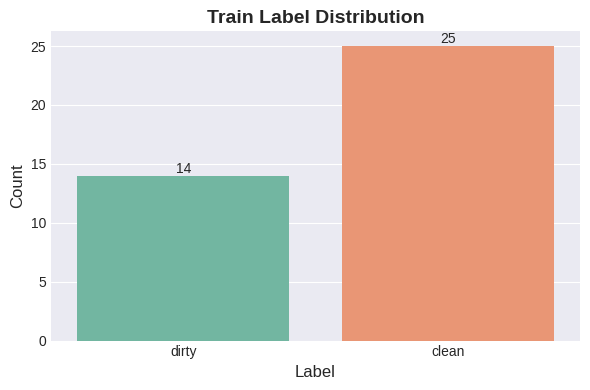

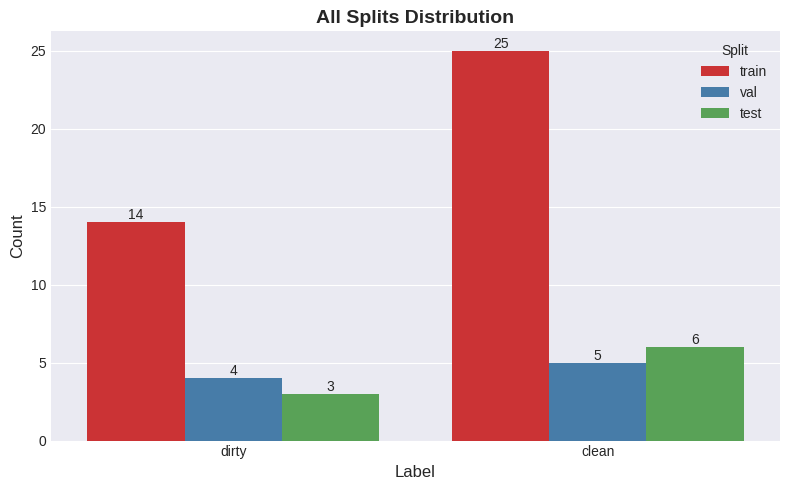

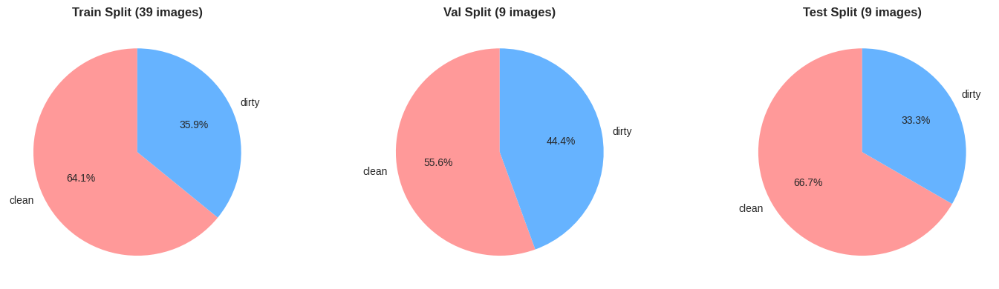


📊 데이터 요약 테이블
label  clean  dirty  Total
split                     
test       6      3      9
train     25     14     39
val        5      4      9
Total     36     21     57


In [104]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from pathlib import Path
from sklearn.model_selection import train_test_split

# 설정
root = Path("/home/jetson/2026_youth/ai26/wash_data")
clean_dir = root / "clean"
dirty_dir = root / "dirty"

IMG_EXTS = {".png", ".jpg", ".jpeg"}

# 이미지 수집 함수
def collect_images(class_dir: Path, label: str) -> list:
    """폴더에서 이미지 수집"""
    rows = []
    if not class_dir.exists():
        print(f"⚠️  {class_dir} 폴더가 없습니다!")
        return rows
    
    for img_path in class_dir.rglob("*"):
        if img_path.is_file() and img_path.suffix.lower() in IMG_EXTS:
            rows.append({
                "path": str(img_path),
                "label": label
            })
    return rows

# 이미지 수집
clean_rows = collect_images(clean_dir, "clean")
dirty_rows = collect_images(dirty_dir, "dirty")

print(f"✅ clean 이미지: {len(clean_rows)}개")
print(f"✅ dirty 이미지: {len(dirty_rows)}개")

# DataFrame 생성
all_rows = clean_rows + dirty_rows
df_all = pd.DataFrame(all_rows)

# train/val/test 분할 (70/15/15)
train_df, temp_df = train_test_split(
    df_all, 
    test_size=0.3, 
    stratify=df_all["label"],
    random_state=42
)

val_df, test_df = train_test_split(
    temp_df, 
    test_size=0.5,
    stratify=temp_df["label"],
    random_state=42
)

# split 정보 추가
train_df = train_df.copy()
val_df = val_df.copy()
test_df = test_df.copy()

train_df["split"] = "train"
val_df["split"] = "val"
test_df["split"] = "test"

# 전체 DataFrame
df = pd.concat([train_df, val_df, test_df], ignore_index=True)

# 통계 출력
print(f"\n✅ train: {len(train_df)}개")
print(train_df["label"].value_counts())
print(f"\n✅ val: {len(val_df)}개")
print(val_df["label"].value_counts())
print(f"\n✅ test: {len(test_df)}개")
print(test_df["label"].value_counts())

# 시각화
plt.style.use('seaborn-v0_8-darkgrid')  # 스타일 설정 (옵션)

# 1. Train 데이터 분포
plt.figure(figsize=(6, 4))
sns.countplot(data=train_df, x="label", order=["dirty", "clean"], palette="Set2")
plt.title("Train Label Distribution", fontsize=14, fontweight='bold')
plt.xlabel("Label", fontsize=12)
plt.ylabel("Count", fontsize=12)
for container in plt.gca().containers:
    plt.gca().bar_label(container)  # 막대 위에 숫자 표시
plt.tight_layout()
plt.show()

# 2. 전체 split별 분포
plt.figure(figsize=(8, 5))
sns.countplot(data=df, x="label", hue="split", order=["dirty", "clean"], palette="Set1")
plt.title("All Splits Distribution", fontsize=14, fontweight='bold')
plt.xlabel("Label", fontsize=12)
plt.ylabel("Count", fontsize=12)
plt.legend(title="Split", fontsize=10)
for container in plt.gca().containers:
    plt.gca().bar_label(container)  # 막대 위에 숫자 표시
plt.tight_layout()
plt.show()

# 3. 추가 시각화: Split별 비율
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

for idx, (split_name, split_data) in enumerate([("Train", train_df), ("Val", val_df), ("Test", test_df)]):
    counts = split_data["label"].value_counts()
    axes[idx].pie(counts, labels=counts.index, autopct='%1.1f%%', startangle=90, colors=['#ff9999', '#66b3ff'])
    axes[idx].set_title(f"{split_name} Split ({len(split_data)} images)", fontsize=12, fontweight='bold')

plt.tight_layout()
plt.show()

# 4. 요약 테이블
summary = df.groupby(['split', 'label']).size().unstack(fill_value=0)
summary['Total'] = summary.sum(axis=1)
summary.loc['Total'] = summary.sum()

print("\n" + "="*50)
print("📊 데이터 요약 테이블")
print("="*50)
print(summary)
print("="*50)

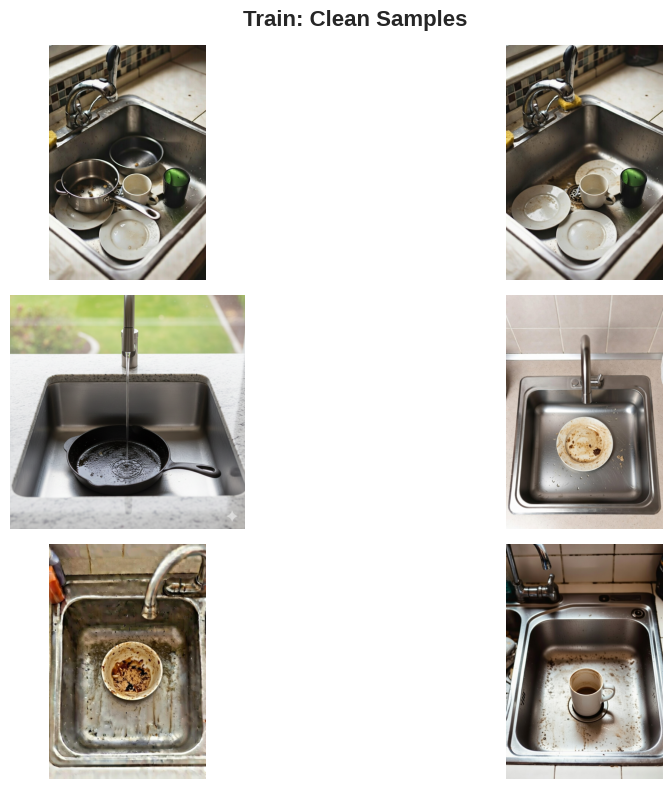

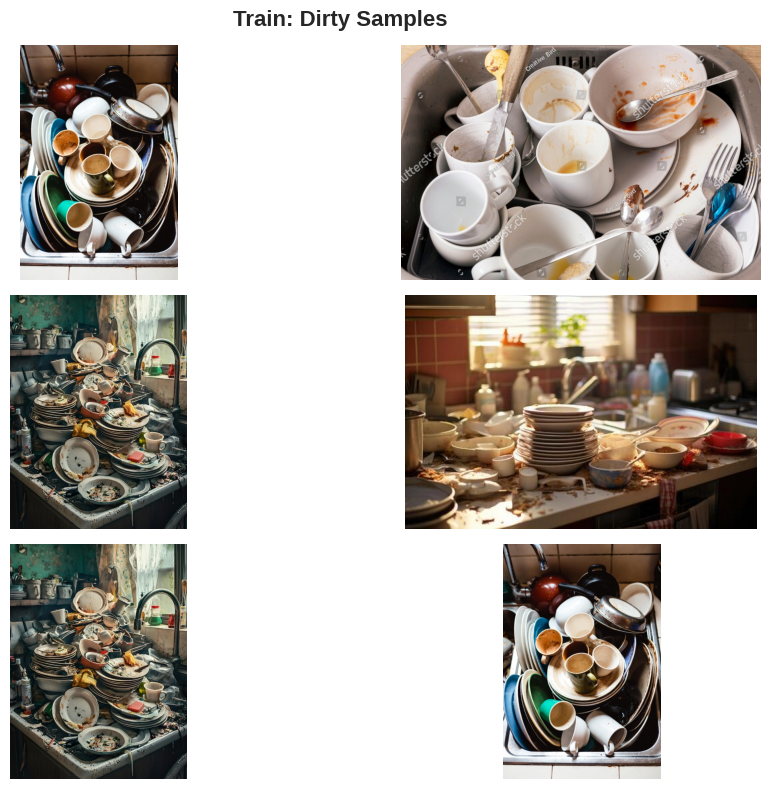

In [105]:
def show_samples(df_part, label, title, pics=6):
    data = df_part[df_part["label"] == label]
    fig, ax = plt.subplots(int(pics//2), 2, figsize=(12, 8))
    plt.suptitle(title, fontsize=16, fontweight='bold')
    ax = ax.ravel()
    for i in range((pics//2)*2):
        path = data.sample(1, random_state=None)["path"].values[0]
        img = image.load_img(path)
        img = image.img_to_array(img)/255.0
        ax[i].imshow(img)
        ax[i].axis("off")
    plt.tight_layout()
    plt.show()

# 라벨명만 수정
show_samples(train_df, "clean", "Train: Clean Samples", pics=6)
show_samples(train_df, "dirty", "Train: Dirty Samples", pics=6)

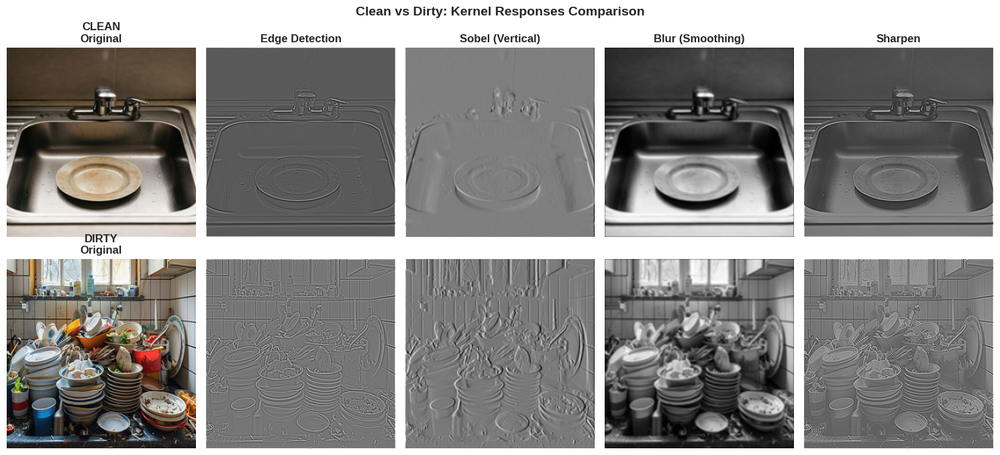

In [106]:
# Clean vs Dirty 이미지 비교
fig, axes = plt.subplots(2, 5, figsize=(15, 7))

for row_idx, label in enumerate(["clean", "dirty"]):
    img_path = Path(train_df[train_df["label"] == label].sample(1)["path"].iloc[0])
    img = Image.open(img_path).convert("RGB").resize((256, 256))
    arr = np.array(img).astype(np.float32) / 255.0
    gray = arr.mean(axis=2, keepdims=True)
    
    # 원본
    axes[row_idx, 0].imshow(arr)
    axes[row_idx, 0].set_title(f"{label.upper()}\nOriginal", fontweight='bold')
    axes[row_idx, 0].axis("off")
    
    # 각 커널 적용
    for col_idx, (name, k) in enumerate(kernels.items(), start=1):
        k4 = k.reshape(3, 3, 1, 1)
        out = tf.nn.conv2d(gray[None, ...], k4, strides=1, padding="SAME")[0, ..., 0].numpy()
        out = (out - out.min()) / (out.max() - out.min() + 1e-8)
        
        axes[row_idx, col_idx].imshow(out, cmap="gray")
        if row_idx == 0:
            axes[row_idx, col_idx].set_title(name, fontweight='bold')
        axes[row_idx, col_idx].axis("off")

plt.suptitle("Clean vs Dirty: Kernel Responses Comparison", 
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

Found 39 validated image filenames belonging to 2 classes.
Found 9 validated image filenames belonging to 2 classes.
Found 9 validated image filenames belonging to 2 classes.
데이터 로더 생성 완료!
Train samples: 39 | Steps: 2
Val samples:   9 | Steps: 1
Test samples:  9 | Steps: 1

Class indices: {'clean': 0, 'dirty': 1}

=== Clean 이미지 증강 예시 ===


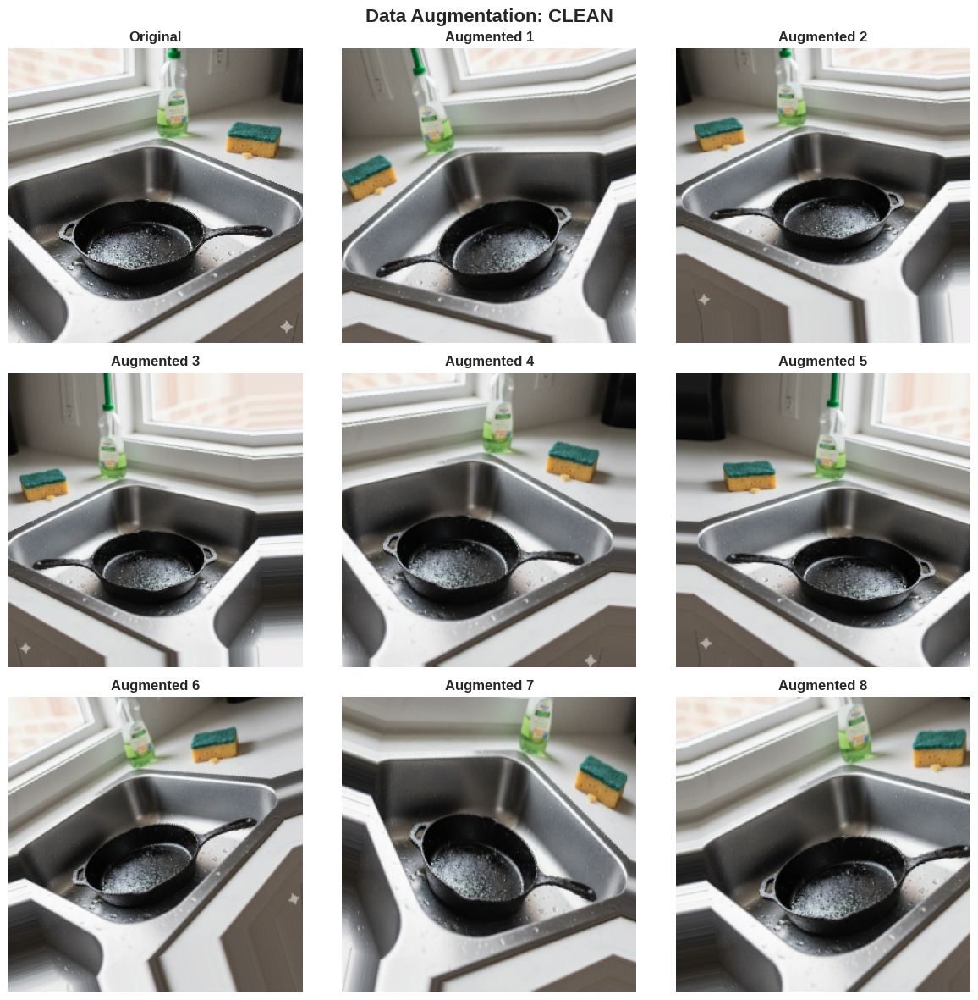


=== Dirty 이미지 증강 예시 ===


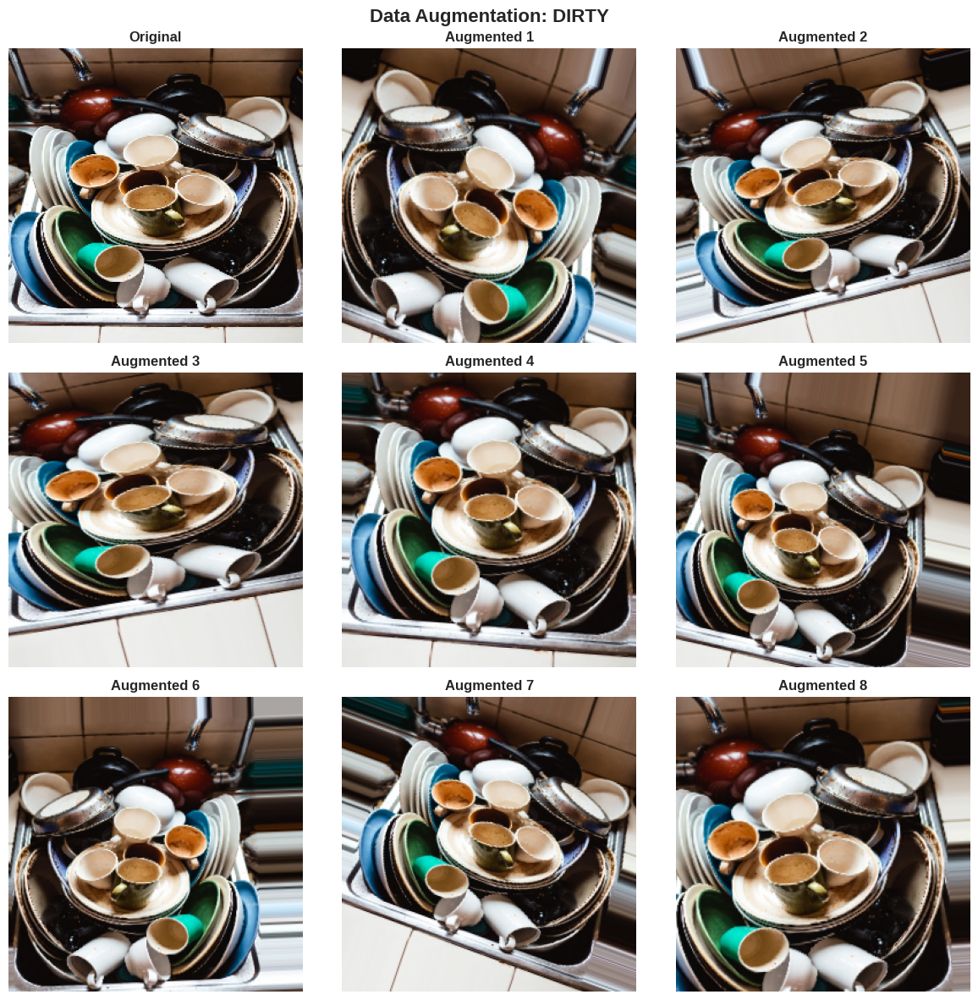

In [107]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.preprocessing import image

# ===== 1. 데이터 증강 설정 =====
IMG_SIZE = (256, 256)
BATCH = 32

# Train: 데이터 증강 적용
train_gen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.2,
    horizontal_flip=True,
    rescale=1/255.0
)

# Val/Test: 증강 없이 정규화만
eval_gen = ImageDataGenerator(rescale=1/255.0)

# ===== 2. 데이터 로더 생성 =====
train_loader = train_gen.flow_from_dataframe(
    train_df,
    x_col="path",
    y_col="label",
    classes=["clean", "dirty"],
    target_size=IMG_SIZE,
    class_mode="binary",
    batch_size=BATCH,
    shuffle=True,
    seed=42
)

val_loader = eval_gen.flow_from_dataframe(
    val_df,
    x_col="path",
    y_col="label",
    classes=["clean", "dirty"],
    target_size=IMG_SIZE,
    class_mode="binary",
    batch_size=BATCH,
    shuffle=False
)

test_loader = eval_gen.flow_from_dataframe(
    test_df,
    x_col="path",
    y_col="label",
    classes=["clean", "dirty"],
    target_size=IMG_SIZE,
    class_mode="binary",
    batch_size=BATCH,
    shuffle=False
)

# 정보 출력
print("="*60)
print("데이터 로더 생성 완료!")
print("="*60)
print(f"Train samples: {train_loader.n} | Steps: {len(train_loader)}")
print(f"Val samples:   {val_loader.n} | Steps: {len(val_loader)}")
print(f"Test samples:  {test_loader.n} | Steps: {len(test_loader)}")
print(f"\nClass indices: {train_loader.class_indices}")
print("="*60)

# ===== 3. 증강 이미지 시각화 함수 =====
def compare_augmentations(df_part, label, num_augments=8):
    """하나의 이미지를 여러 방식으로 증강하여 비교"""
    # 랜덤 이미지 1장 선택
    sample_path = df_part[df_part["label"] == label].sample(1)["path"].values[0]
    
    img = image.load_img(sample_path, target_size=IMG_SIZE)
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)  # (1, H, W, C)
    
    # 시각화
    fig, axes = plt.subplots(3, 3, figsize=(12, 12))
    axes = axes.ravel()
    
    # 원본
    axes[0].imshow(img)
    axes[0].set_title("Original", fontweight='bold', fontsize=12)
    axes[0].axis("off")
    
    # 증강된 버전들
    aug_gen = train_gen.flow(img_array, batch_size=1)
    for i in range(1, num_augments + 1):
        aug_img = next(aug_gen)[0]
        axes[i].imshow(aug_img)
        axes[i].set_title(f"Augmented {i}", fontweight='bold', fontsize=12)
        axes[i].axis("off")
    
    plt.suptitle(f"Data Augmentation: {label.upper()}", fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()

# ===== 4. 증강 결과 확인 =====
print("\n=== Clean 이미지 증강 예시 ===")
compare_augmentations(train_df, "clean", num_augments=8)

print("\n=== Dirty 이미지 증강 예시 ===")
compare_augmentations(train_df, "dirty", num_augments=8)

In [109]:
# ImageDataGenerator가 생성한 레이블 확인
class_indices = {}
for key in train_loader.class_indices.keys():
    class_indices[train_loader.class_indices[key]] = key

print(class_indices) #여기서 classes 매핑 확인 가능

{0: 'clean', 1: 'dirty'}


## 4) 라벨(txt)을 바운딩박스로 그려보기 (정답 라벨 시각화)

=== Clean 샘플 ===


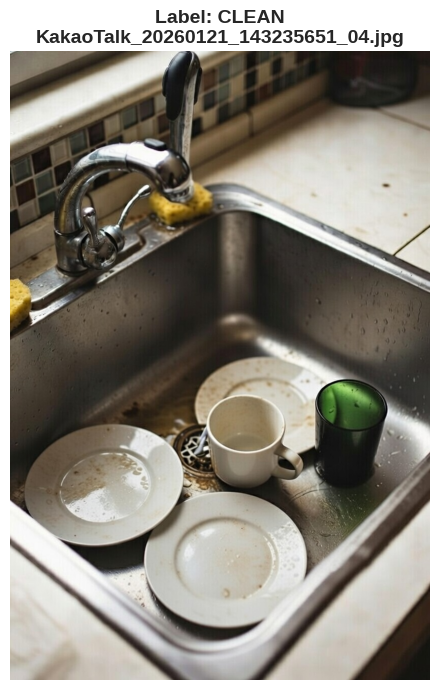


=== Dirty 샘플 ===


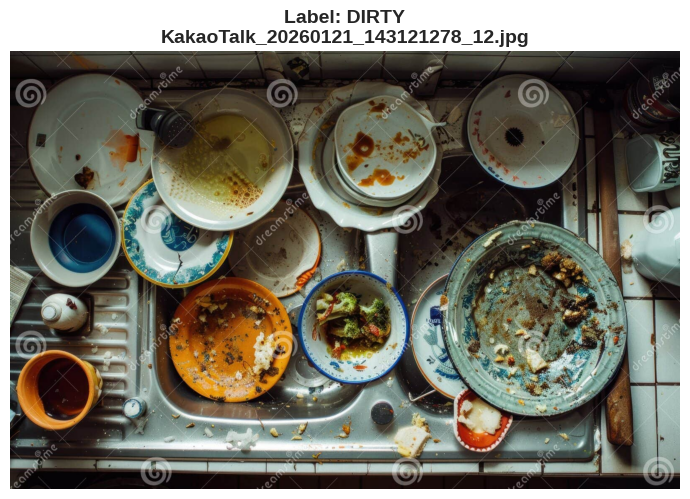

In [112]:
import matplotlib.pyplot as plt
from PIL import Image
from pathlib import Path
import random

def show_sample_image(img_path: Path, label: str):
    """분류용 이미지 표시 (박스 없음)"""
    img = Image.open(img_path).convert("RGB")
    
    plt.figure(figsize=(7, 7))
    ax = plt.gca()
    ax.imshow(img)
    ax.set_title(f"Label: {label.upper()}\n{img_path.name}", 
                 fontsize=14, fontweight='bold')
    ax.axis("off")
    plt.tight_layout()
    plt.show()

# Clean과 Dirty 샘플 보기
print("=== Clean 샘플 ===")
clean_paths = train_df[train_df["label"] == "clean"]["path"].tolist()
if clean_paths:
    sample_path = Path(random.choice(clean_paths))
    show_sample_image(sample_path, "clean")

print("\n=== Dirty 샘플 ===")
dirty_paths = train_df[train_df["label"] == "dirty"]["path"].tolist()
if dirty_paths:
    sample_path = Path(random.choice(dirty_paths))
    show_sample_image(sample_path, "dirty")

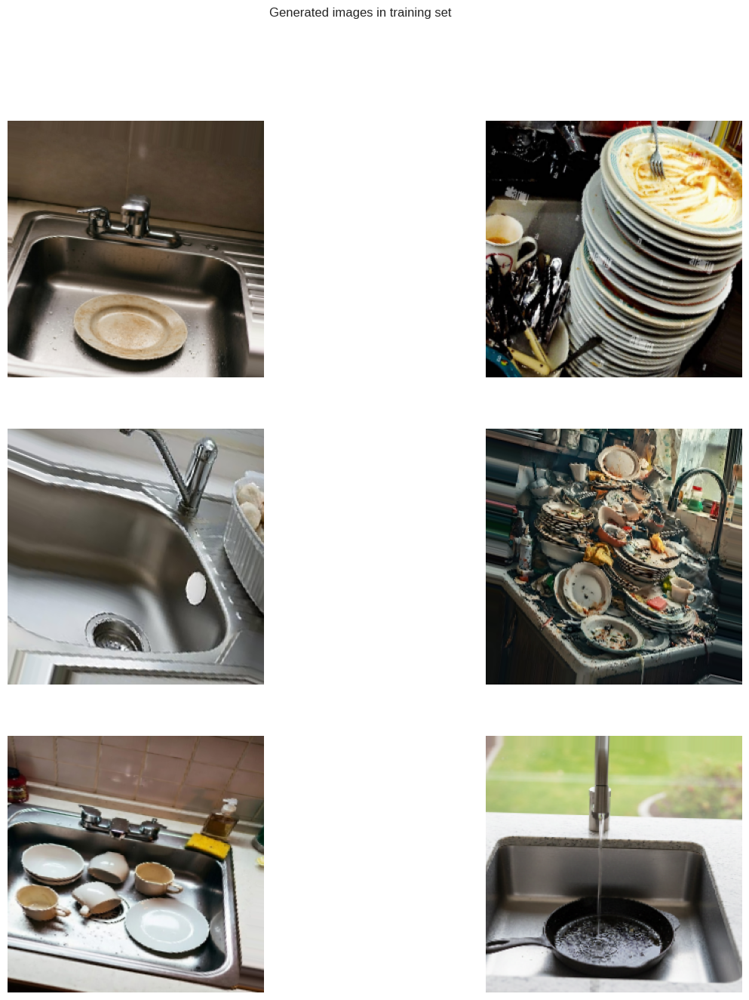

In [113]:
# ImageDataGenerator가 생성한 이미지 확인
# 데이터 증강(Augmentation) = 사진을 조금씩 변형해서 '학습 데이터 늘리기'

pics = 6 # 샘플 갯수
fig,ax = plt.subplots(int(pics//2),2,figsize=(15,15))
plt.suptitle('Generated images in training set')
ax = ax.ravel()
for i in range((pics//2)*2):
    ax[i].imshow(train_loader[0][0][i])
    ax[i].axes.xaxis.set_visible(False)
    ax[i].axes.yaxis.set_visible(False)

In [115]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, Dropout

model = Sequential([
    # Input 레이어 명시
    Input(shape=(256, 256, 3)),
    
    # Conv Block 1
    Conv2D(filters=16, kernel_size=(3, 3), activation='relu', padding='same'),
    MaxPooling2D(pool_size=(2, 2)),
    
    # Conv Block 2
    Conv2D(filters=32, kernel_size=(3, 3), activation='relu', padding='same'),
    MaxPooling2D(pool_size=(2, 2)),
    
    # Conv Block 3
    Conv2D(filters=64, kernel_size=(3, 3), activation='relu', padding='same'),
    MaxPooling2D(pool_size=(2, 2)),
    
    # Conv Block 4
    Conv2D(filters=128, kernel_size=(3, 3), activation='relu', padding='same'),
    MaxPooling2D(pool_size=(2, 2)),
    
    # Flatten and Dense layers
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),  # Overfitting 방지
    Dense(64, activation='relu'),
    Dropout(0.3),
    Dense(1, activation='sigmoid')  # 이진 분류: 0~1 확률 출력
])

model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_7 (Conv2D)               │ (None, 256, 256, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 128, 128, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 128, 128, 32)   │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 128)            │     4,194,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,300,193 (16.40 MB)

 Trainable params: 4,300,193 (16.40 MB)

 Non-trainable params: 0 (0.00 B)

In [116]:
# 모델 컴파일

from tensorflow.keras.metrics import Recall,AUC#Don't touch!!!
from tensorflow.keras.utils import plot_model

model.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy',Recall(),AUC()]) # 왜 binary_crossentrophy 일까요?  # 왜 Recall이 중요할까요? I don't know

In [117]:
# 조기종료 적용

from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

early_stoppping = EarlyStopping(monitor='val_loss',patience=5,restore_best_weights=True)

In [123]:
class_weight={0:1, 0:2.}#{0:0.3, 1:1.}

In [124]:
# 학습
model.fit(x=train_loader,batch_size=32,epochs=5,validation_data=val_loader,callbacks=[early_stoppping], class_weight=class_weight)#image process

# 먼저 실제 데이터 개수 확인
print("=== 데이터 개수 확인 ===")
print(f"Train: {len(train_df)}개")
print(f"Val: {len(val_df)}개")
print(f"Test: {len(test_df)}개")
print("\nTrain 클래스 분포:")
print(train_df["label"].value_counts())
print("\nVal 클래스 분포:")
print(val_df["label"].value_counts())

# 각 클래스별 개수
train_clean = len(train_df[train_df["label"] == "clean"])
train_dirty = len(train_df[train_df["label"] == "dirty"])
print(f"\nTrain - Clean: {train_clean}, Dirty: {train_dirty}")

Epoch 1/5
2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 875ms/step - accuracy: 0.6410 - auc_1: 0.4657 - loss: 0.9719 - recall_1: 0.1429 - val_accuracy: 0.5556 - val_auc_1: 0.9500 - val_loss: 0.6430 - val_recall_1: 0.0000e+00
Epoch 2/5
2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - accuracy: 0.7179 - auc_1: 0.6771 - loss: 0.8728 - recall_1: 0.3571 - val_accuracy: 0.5556 - val_auc_1: 0.7500 - val_loss: 0.6932 - val_recall_1: 0.0000e+00
Epoch 3/5
2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 645ms/step - accuracy: 0.6667 - auc_1: 0.5614 - loss: 0.8488 - recall_1: 0.0714 - val_accuracy: 0.5556 - val_auc_1: 0.7500 - val_loss: 0.7416 - val_recall_1: 0.0000e+00
Epoch 4/5
2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 3s/step - accuracy: 0.6410 - auc_1: 0.6500 - loss: 0.8380 - recall_1: 0.0000e+00 - val_accuracy: 0.5556 - val_auc_1: 0.7500 - val_loss: 0.7182 - val_recall_1: 0.0000e+00
Epoch 5/5
2/2 ━━━━━━━━━━━━━━━━━━━━ 5s 696ms/step - accuracy: 0.6410 - auc_1: 0.6729 - loss: 0.8105 - recall_1: 0.0000e+00 - val_accuracy: 0.5556 - val_auc_1: 0.7500 - val_los

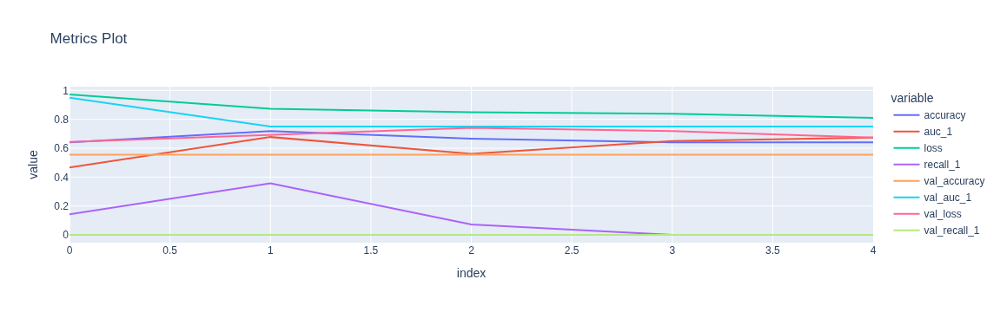

In [125]:
# 학습 그래프 보기 Don't touch

history= model.history.history
fig = px.line(history,title = "Metrics Plot")
fig.show()

In [127]:
# 모델 평가
eval_list = model.evaluate(test_loader,return_dict=True)
for metric in eval_list.keys():
    print(metric+f": {eval_list[metric]:.2f}")

# 잘한 것일까요? yes

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 645ms/step - accuracy: 0.6667 - auc_1: 0.5556 - loss: 0.6386 - recall_1: 0.0000e+00
accuracy: 0.67
auc_1: 0.56
loss: 0.64
recall_1: 0.00


In [ ]:
if 